In [1]:
# Import Libraries 
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
import os
from PIL import Image
# Tensorflow
import tensorflow as tf 
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Embedding
from tensorflow.keras.applications import InceptionV3
# import Early Stopping/Callbacks
from tensorflow.keras.callbacks import EarlyStopping
# import Image Data Generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# ignore warnings 
import warnings
warnings.filterwarnings('ignore')

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the path to your dataset
dataset_path = 'C:/RAJA/images'

# Set the parameters for loading the dataset
batch_size = 32
img_height = 224
img_width = 224

# Create an ImageDataGenerator instance for data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,      # Rescale pixel values from [0, 255] to [0, 1]
    validation_split=0.2    # Use 20% of data for validation
)

# Load training data
train_generator = train_datagen.flow_from_directory(
    directory=dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Set as training data
)

# Load validation data
validation_generator = train_datagen.flow_from_directory(
    directory=dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Set as validation data
)

Found 288 images belonging to 9 classes.
Found 71 images belonging to 9 classes.


In [3]:
# Display some information about the dataset
print("Dataset Information:")
print(f'Training samples: {train_generator.samples}')
print(f'Validation samples: {validation_generator.samples}')
print(f'Class indices: {train_generator.class_indices}')

Dataset Information:
Training samples: 288
Validation samples: 71
Class indices: {'apple fruit': 0, 'banana fruit': 1, 'cherry fruit': 2, 'chickoo fruit': 3, 'grapes fruit': 4, 'kiwi fruit': 5, 'mango fruit': 6, 'orange fruit': 7, 'strawberry fruit': 8}


In [4]:
# Let's check the type of file paths
print(type(train_generator.filepaths))

<class 'list'>


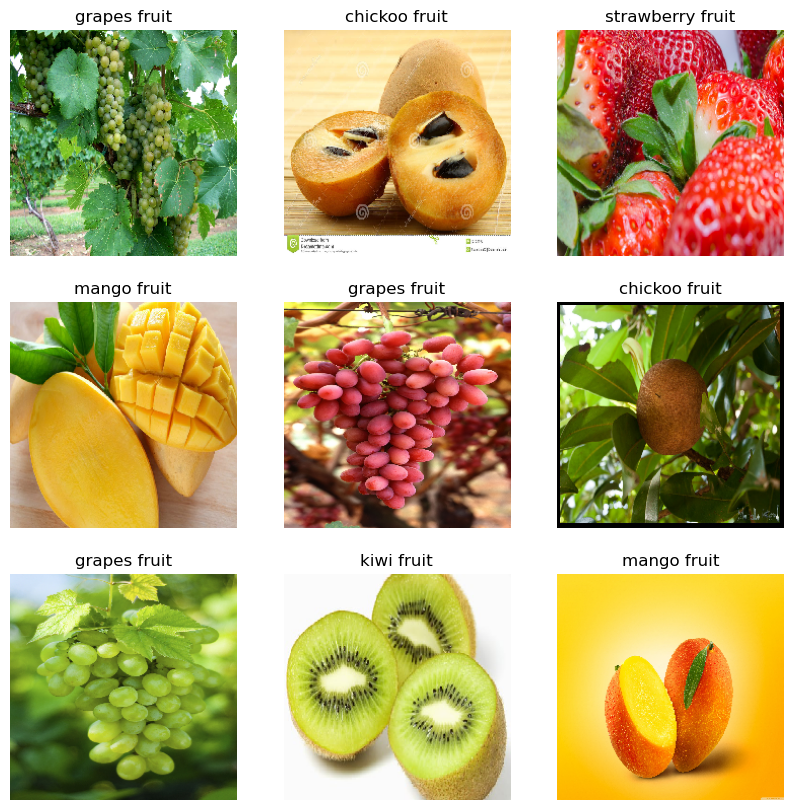

In [5]:
# Function to get class labels from one-hot encoded vectors
def get_class_label(one_hot_encoded_label):
    class_index = np.argmax(one_hot_encoded_label)
    class_label = list(train_generator.class_indices.keys())[class_index]
    return class_label

# Retrieve a batch of images and labels
batch_images, batch_labels = next(train_generator)

# Display the first few images with their class labels
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(batch_images[i])
    # Convert one-hot encoded label to class label
    label = get_class_label(batch_labels[i])
    plt.title(label)
    plt.axis("off")
plt.show()

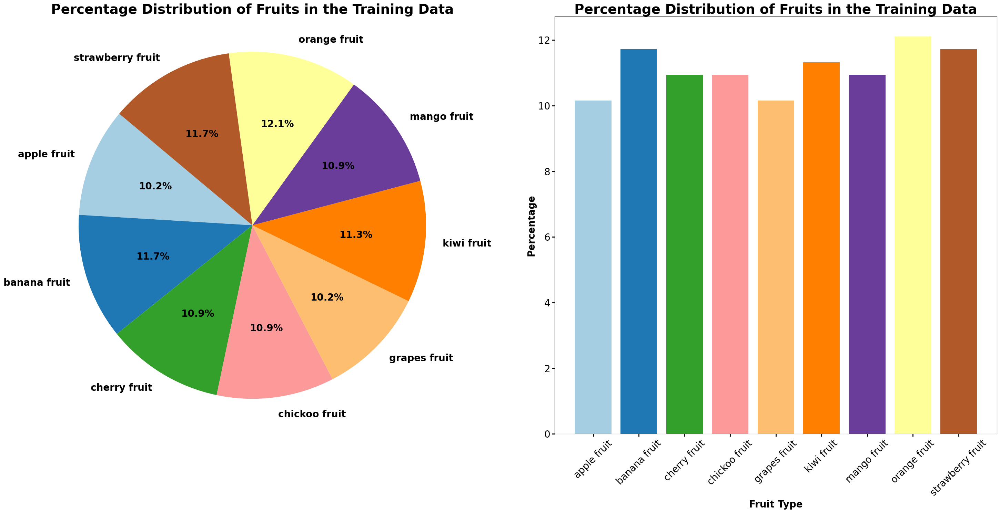

In [6]:
# Retrieve class indices and corresponding labels
class_indices = train_generator.class_indices
class_labels = list(class_indices.keys())

# Count the number of samples in each class
num_classes = len(class_labels)
class_counts = np.zeros(num_classes)

# Iterate through the batches of the generator and count the occurrences of each class
for _, labels in train_generator:
    class_counts += labels.sum(axis=0)
    if train_generator.batch_index == 0:
        break

# Calculate percentage distribution
class_percentages = (class_counts / class_counts.sum()) * 100

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(30, 15))

# Plot the pie chart
axs[0].pie(class_percentages, labels=class_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired(np.linspace(0, 1, num_classes)), textprops={'fontsize': 20, 'fontweight': 'bold'})
axs[0].set_title('Percentage Distribution of Fruits in the Training Data', fontsize=28, fontweight='bold')
axs[0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Plot the bar chart
axs[1].bar(class_labels, class_percentages, color=plt.cm.Paired(np.linspace(0, 1, num_classes)))
axs[1].set_xlabel('Fruit Type', fontsize=20, fontweight='bold')
axs[1].set_ylabel('Percentage', fontsize=20, fontweight='bold')
axs[1].set_title('Percentage Distribution of Fruits in the Training Data', fontsize=28, fontweight='bold')
axs[1].tick_params(axis='x', rotation=45, labelsize=20, width=2, length=6)  # Set the tick parameters for x-axis
axs[1].tick_params(axis='y', labelsize=20, width=2, length=6)  # Set the tick parameters for y-axis

# Make labels bold
for ax in axs:
    ax.xaxis.label.set_fontweight('bold')
    ax.yaxis.label.set_fontweight('bold')

# Display the plots
plt.tight_layout()
plt.show()

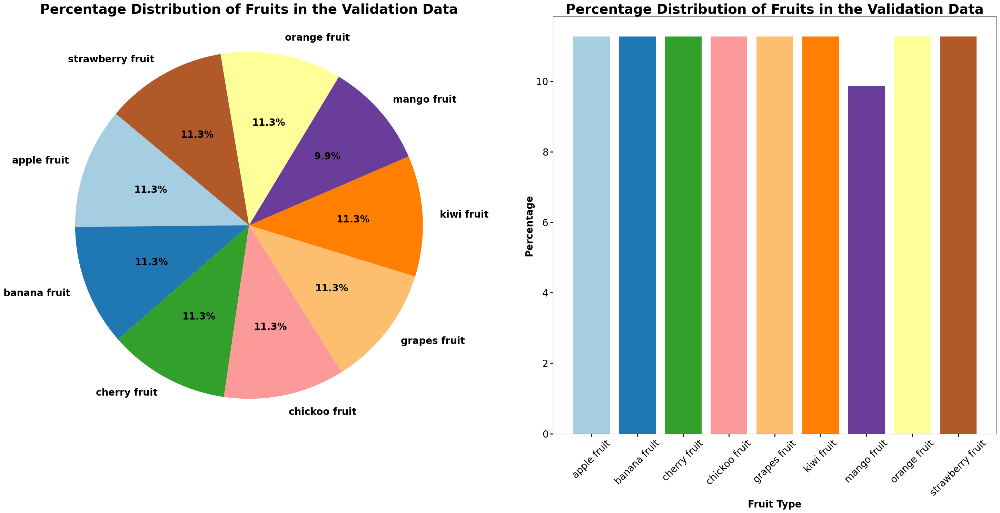

In [7]:
# Retrieve class indices and corresponding labels for validation data
val_class_indices = validation_generator.class_indices
val_class_labels = list(val_class_indices.keys())

# Count the number of samples in each class for validation data
val_num_classes = len(val_class_labels)
val_class_counts = np.zeros(val_num_classes)

# Iterate through the batches of the generator and count the occurrences of each class for validation data
for _, labels in validation_generator:
    val_class_counts += labels.sum(axis=0)
    if validation_generator.batch_index == 0:
        break

# Calculate percentage distribution for validation data
val_class_percentages = (val_class_counts / val_class_counts.sum()) * 100

# Create subplots for validation data
fig, axs = plt.subplots(1, 2, figsize=(30, 15))

# Plot the pie chart for validation data
axs[0].pie(val_class_percentages, labels=val_class_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired(np.linspace(0, 1, val_num_classes)), textprops={'fontsize': 20, 'fontweight': 'bold'})
axs[0].set_title('Percentage Distribution of Fruits in the Validation Data', fontsize=28, fontweight='bold')
axs[0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Plot the bar chart for validation data
axs[1].bar(val_class_labels, val_class_percentages, color=plt.cm.Paired(np.linspace(0, 1, val_num_classes)))
axs[1].set_xlabel('Fruit Type', fontsize=20, fontweight='bold')
axs[1].set_ylabel('Percentage', fontsize=20, fontweight='bold')
axs[1].set_title('Percentage Distribution of Fruits in the Validation Data', fontsize=28, fontweight='bold')
axs[1].tick_params(axis='x', rotation=45, labelsize=20, width=2, length=6)  # Set the tick parameters for x-axis
axs[1].tick_params(axis='y', labelsize=20, width=2, length=6)  # Set the tick parameters for y-axis

# Make labels bold for validation data
for ax in axs:
    ax.xaxis.label.set_fontweight('bold')
    ax.yaxis.label.set_fontweight('bold')

# Display the plots for validation data
plt.tight_layout()
plt.show()

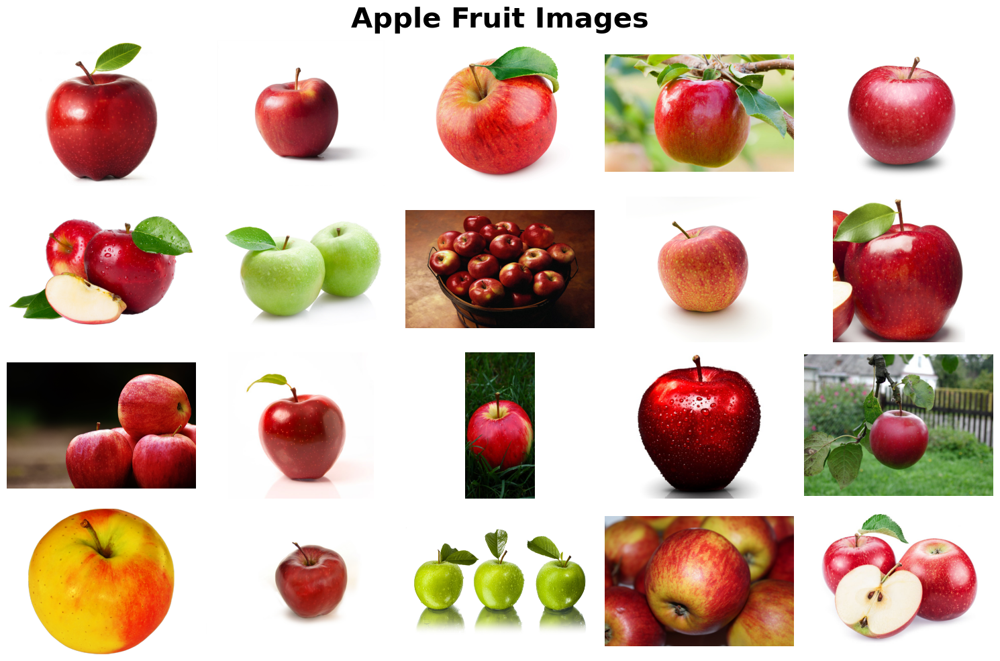

In [8]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/apple fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Apple Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

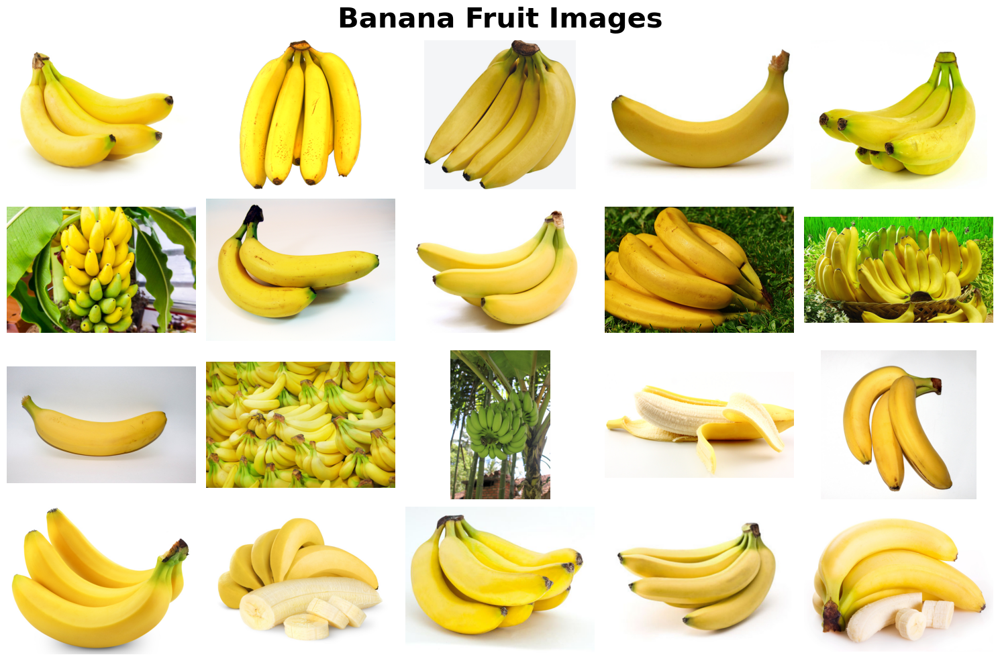

In [9]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/banana fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Banana Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

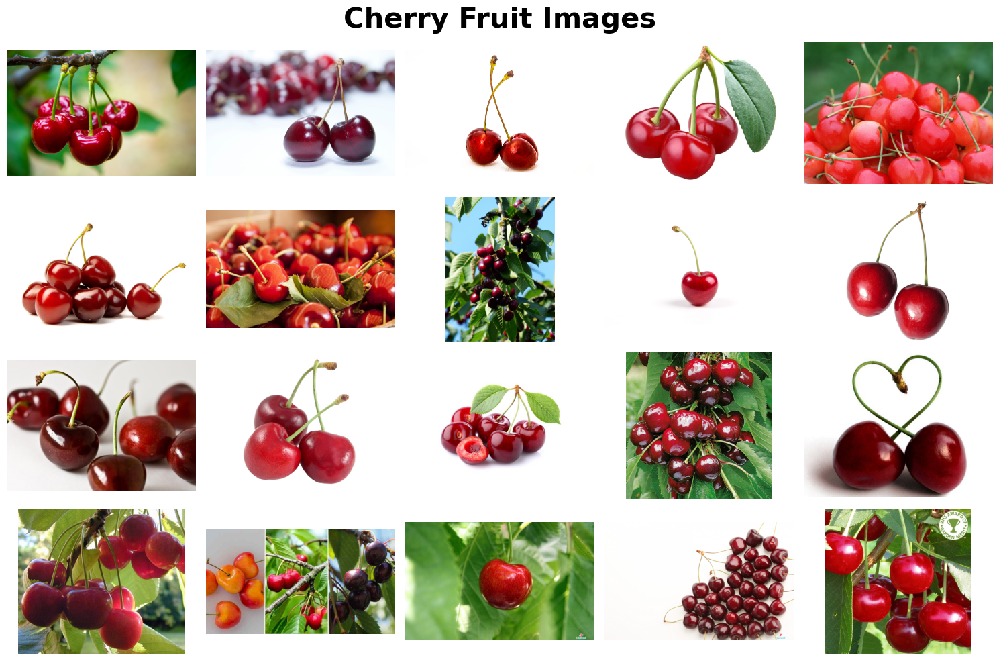

In [10]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/cherry fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Cherry Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

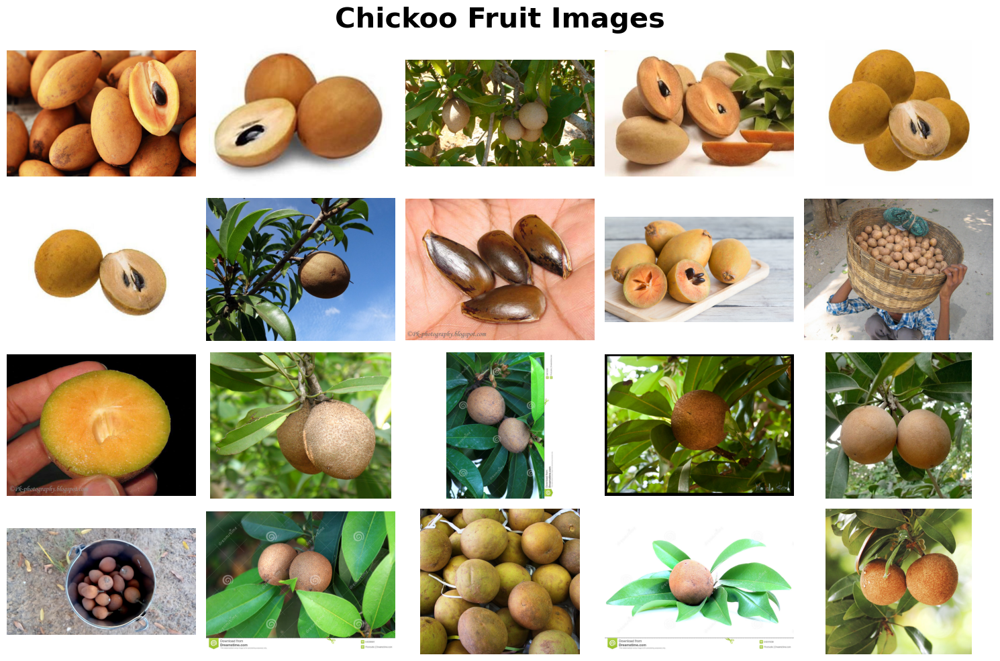

In [11]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/chickoo fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Chickoo Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

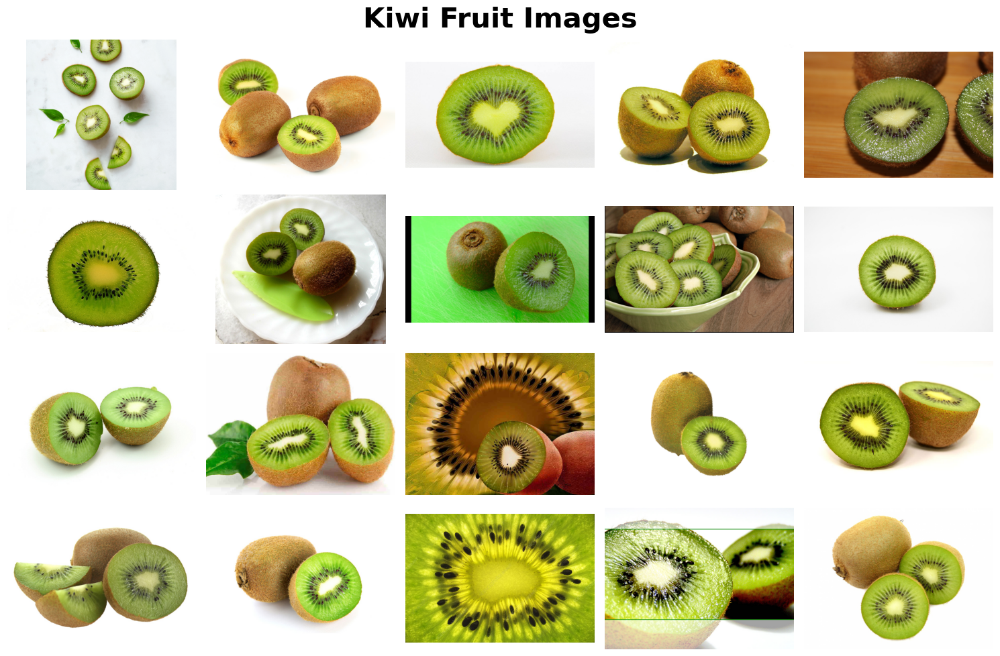

In [12]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/kiwi fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Kiwi Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

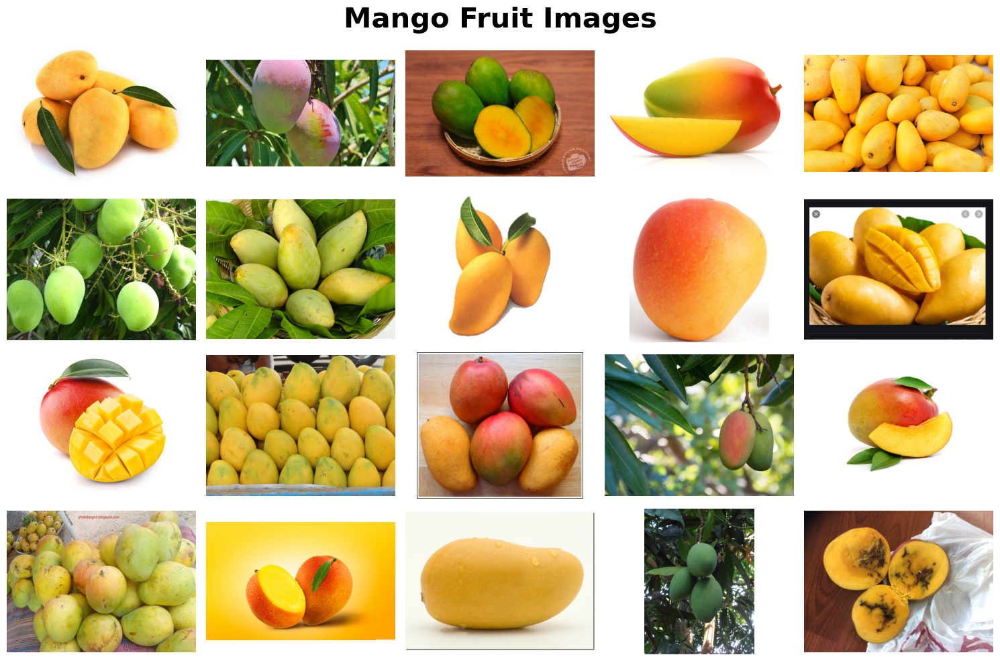

In [13]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/mango fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Mango Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

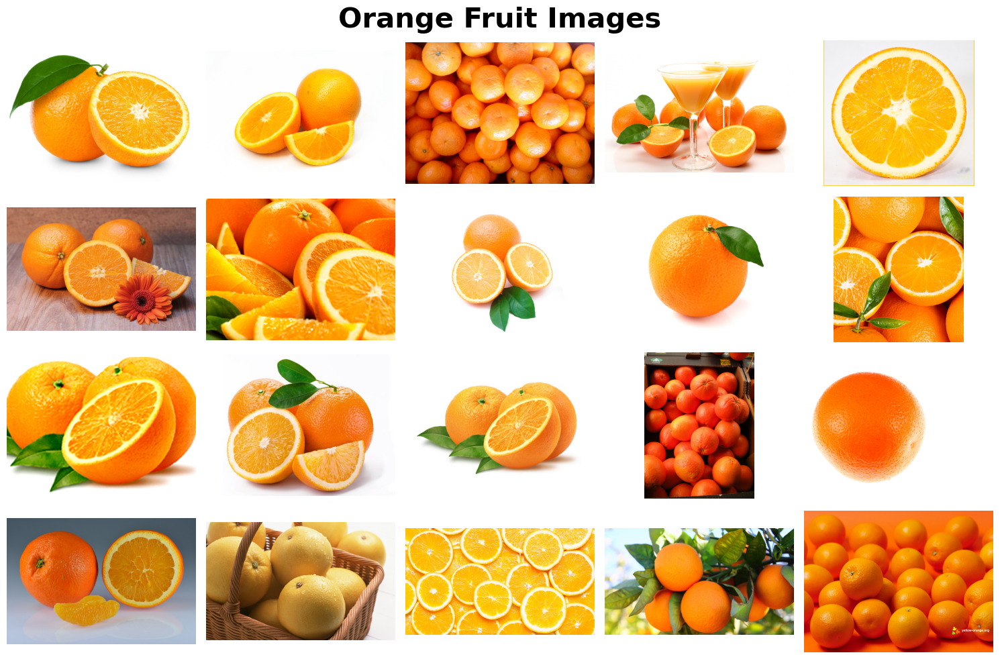

In [14]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/orange fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("Orange Fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

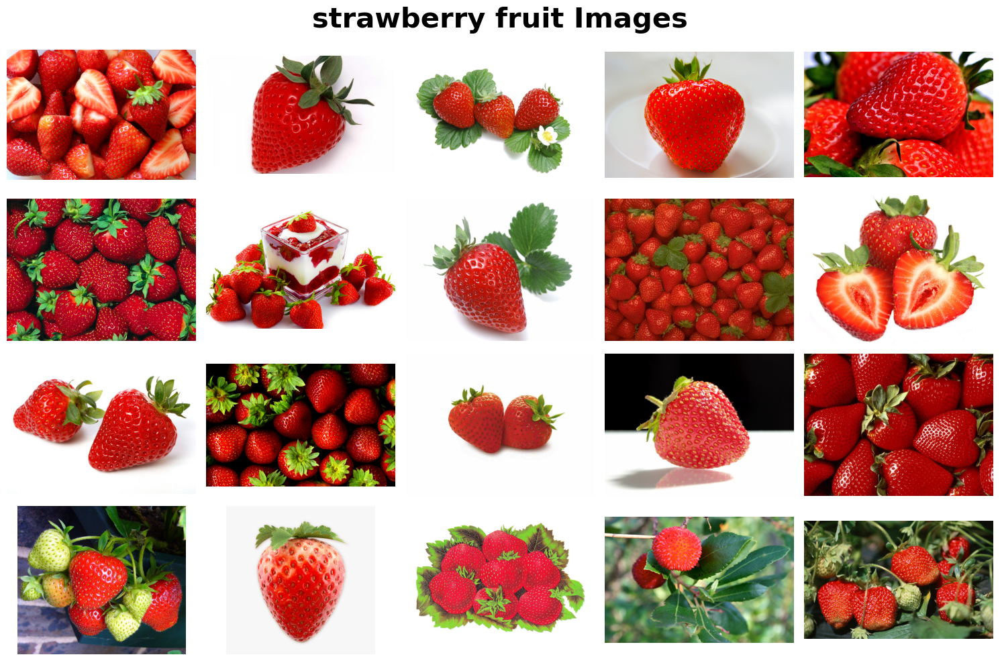

In [15]:
# Specify the folder you want to display images from
specific_folder_path = 'C:/RAJA/images/strawberry fruit'

# Get the list of images in the specified folder
fruit_images = os.listdir(specific_folder_path)[:20]  # Get the first 20 images

# Display the first 20 images from the apple fruit folder
plt.figure(figsize=(15, 10))
plt.suptitle("strawberry fruit Images", fontsize=30, fontweight='bold')
for i, image_name in enumerate(fruit_images):
    image_path = os.path.join(specific_folder_path, image_name)
    image = plt.imread(image_path)
    
    # Extract label from the image filename
    label = image_name.split('.')[0]  # Assuming the label is before the first period
    
    plt.subplot(4, 5, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [16]:
# Define the number of classes
num_classes = len(train_generator.class_indices)
num_classes

9

In [17]:
from tensorflow.keras.callbacks import EarlyStopping

# Load InceptionV3 base model without the top layer
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Add new layers on top of the base model
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)  # Reduce the number of units for simplicity
x = layers.Dropout(0.5)(x)  # Add dropout for regularization
predictions = layers.Dense(num_classes, activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Fine-tuning strategy: unfreeze only the last few layers for fine-tuning
for layer in base_model.layers[:-20]:  # Freeze all layers except the last 20
    layer.trainable = False

# Compile the model with a lower learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(train_generator, epochs=10, validation_data=validation_generator, callbacks=[early_stopping])

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 42s 3s/step - accuracy: 0.2405 - loss: 2.2342 - val_accuracy: 0.7465 - val_loss: 1.1176
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.7204 - loss: 1.1963 - val_accuracy: 0.8592 - val_loss: 0.6815
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.8141 - loss: 0.8123 - val_accuracy: 0.8873 - val_loss: 0.4595
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9184 - loss: 0.4734 - val_accuracy: 0.9296 - val_loss: 0.3503
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.9605 - loss: 0.3443 - val_accuracy: 0.9155 - val_loss: 0.3060
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.9717 - loss: 0.2415 - val_accuracy: 0.9155 - val_loss: 0.2681
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.9735 - loss: 0.2026 - val_accuracy: 0.9014 - val_loss: 0.2552
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.9652 - loss: 0.2040 - val_accuracy: 0.9155 - val_loss: 0.2492
Epoch 9/

In [18]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 27,254,077 (103.97 MB)

 Trainable params: 2,462,217 (9.39 MB)

 Non-trainable params: 19,867,424 (75.79 MB)

 Optimizer params: 4,924,436 (18.79 MB)

In [22]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

test_dir = "C:/RAJA/images"  # Change this to your actual test folder

# Load test images using ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),  # Change this based on your model's input size
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

# Extract data and labels
X_test, y_test = next(test_generator)

# Save as .npy files
np.save("X_test.npy", X_test)
np.save("y_test.npy", y_test)

print("Test dataset saved as X_test.npy and y_test.npy")


Found 359 images belonging to 9 classes.
Test dataset saved as X_test.npy and y_test.npy


In [23]:
if 'test_generator' not in locals():
    print("Error: test_generator is not defined. Please load the test data correctly.")
else:
    print("Evaluating model on test data...")  # Progress message
    loss, accuracy = model.evaluate(test_generator, verbose=1)  # Show progress
    print("\n🔹 Model Evaluation Results 🔹")
    print(f"📉 Test Loss     : {loss:.4f}")  # Format loss
    print(f"✅ Test Accuracy : {accuracy:.2%}")  # Show accuracy as percentage

Evaluating model on test data...
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9799 - loss: 0.0969

🔹 Model Evaluation Results 🔹
📉 Test Loss     : 0.0693
✅ Test Accuracy : 98.89%


In [48]:
# Save the model to an HDF5 file
model.save('model.h5')

# Save the model in TensorFlow SavedModel format
model.save('C:/RAJA/model.h5')

In [47]:
model.save('C:/RAJA/mod/my_model.keras')


AttributeError: module 'tensorflow.keras' has no attribute 'saving'